In [1]:
#Datos de las imágenes guardadas
augmentation = 'no' #si/no
#no_inhomogeneidades
#BM4D = sí
#quitar_slices = 4

#SEED = 50

SEED = 50

In [2]:
import tensorflow

C:\Users\usuario\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\usuario\anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\usuario\anaconda3\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [3]:
import numpy
print(numpy.__version__)

1.24.2


In [4]:
tensorflow.config.experimental.set_memory_growth(tensorflow.config.list_physical_devices('GPU')[0], True)

In [5]:
import scipy.io
import os
#import fastmri
#from fastmri.data import transforms as T
import numpy as np
from matplotlib import pyplot as plt
import random

import tensorflow
from tensorflow.keras import layers
from tensorflow.keras.layers import BatchNormalization

import math

from skimage.metrics import structural_similarity as ssim

from sklearn.model_selection import train_test_split

from random import randint

import matplotlib.patches as patches
from bm4d import bm4d

import cv2 as cv

from datetime import datetime 
import time

import utils

In [6]:
os.getcwd()

'C:\\Users\\usuario\\Desktop\\TFM\\TFM_ordenador_FER\\physio_MRI\\physio_code\\AE_Physio\\multiple_n'

## Load images

In [7]:
def load_n_scans_images(n_scans):
    x_train = np.load('../save_images/no_augmentation/n_scans_' + str(n_scans) +'/bm4d_and_no_inhom/x_train.npy')
    x_train_noisy = np.load('../save_images/no_augmentation/n_scans_' + str(n_scans) +'/bm4d_and_no_inhom/x_train_noisy.npy')
    x_test = np.load('../save_images/no_augmentation/n_scans_' + str(n_scans) +'/bm4d_and_no_inhom/x_test.npy')
    x_test_noisy = np.load('../save_images/no_augmentation/n_scans_' + str(n_scans) +'/bm4d_and_no_inhom/x_test_noisy.npy')
    
    return x_train, x_train_noisy, x_test, x_test_noisy

In [8]:
#20% 1
#20% 2
#10% 3
#5% 4,5,6,7,8,9,10,11
#2.5% 12
#2.5% 13

n_scans = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
n_scans_per = [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
#n_scans_per = [1, 1, 1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.95, 0.95, 0.95, 0.95, 0.95]

x_train_def = []
x_train_noisy_def = []
x_test_def = []
x_test_noisy_def = []

for n_scans, n_scans_per in zip(n_scans, n_scans_per):
    x_train, x_train_noisy, x_test, x_test_noisy = load_n_scans_images(n_scans)

    x_train, nada = train_test_split(x_train, test_size=n_scans_per, random_state=n_scans)
    x_train_noisy, nada = train_test_split(x_train_noisy, test_size=n_scans_per, random_state=n_scans)
    x_test, nada = train_test_split(x_test, test_size=n_scans_per, random_state=n_scans)
    x_test_noisy, nada = train_test_split(x_test_noisy, test_size=n_scans_per, random_state=n_scans)
    print(f"{x_train.shape}, {x_train_noisy.shape}")
    x_train_def.append(x_train)
    x_train_noisy_def.append(x_train_noisy)
    x_test_def.append(x_test)
    x_test_noisy_def.append(x_test_noisy)

(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)
(143, 160, 160, 1), (143, 160, 160, 1)


In [9]:
x_train = []
x_train_noisy = []
x_test = []
x_test_noisy = []

for i in range(n_scans):
    for j in range(x_train_def[i].shape[0]):
        x_train.append(x_train_def[i][j,:,:,:])
    for j in range(x_train_noisy_def[i].shape[0]):
        x_train_noisy.append(x_train_noisy_def[i][j,:,:,:])
    for j in range(x_test_def[i].shape[0]):
        x_test.append(x_test_def[i][j,:,:,:])
    for j in range(x_test_noisy_def[i].shape[0]):
        x_test_noisy.append(x_test_noisy_def[i][j,:,:,:])
        
x_train = np.asarray(x_train)
x_train_noisy = np.asarray(x_train_noisy)
x_test = np.asarray(x_test)
x_test_noisy = np.asarray(x_test_noisy)

print(x_train.shape)
print(x_train_noisy.shape)
print(x_test.shape)
print(x_test_noisy.shape)

(2145, 160, 160, 1)
(2145, 160, 160, 1)
(525, 160, 160, 1)
(525, 160, 160, 1)


### Data Augmentation

In [10]:
import importlib
import data_augmentation_multiple_n
importlib.reload(data_augmentation_multiple_n)

from data_augmentation_multiple_n import data_augmentation_methods

In [11]:
if augmentation == 'si':
    #Time
    start_time = datetime.now() 
    direct='../../../../Naranjas'
    quitar_slices = 4
    x_train_shape0 = x_train.shape[0]
    mats = os.listdir(direct)
    x_train, x_train_noisy = data_augmentation_methods(mats, direct, quitar_slices, SEED, x_train_shape0, x_train[:,:,:,0], x_train_noisy[:,:,:,0], flipleft = "si", flipupdown = "si", zoom = "si")
    x_train = x_train.reshape(-1, x_train.shape[1], x_train.shape[2],1)
    x_train_noisy = x_train_noisy.reshape(-1, x_train_noisy.shape[1], x_train_noisy.shape[2],1)
    #Time    
    print('Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))

In [12]:
print(x_train.shape)
print(x_train_noisy.shape)

(2145, 160, 160, 1)
(2145, 160, 160, 1)


In [13]:
if augmentation == 'si':
    n = 20
    z = 0

    #ORIGINAL
    fig, axs = plt.subplots(2,n, figsize=(50,10))
    for i in range(0, n):
        axs[0, i].imshow((x_train[i+z].reshape(x_train.shape[1], x_train.shape[1])))
        axs[0, i].get_xaxis().set_visible(False)
        axs[0, i].get_yaxis().set_visible(False)   

        axs[1, i].imshow(x_train_noisy[i+z].reshape(x_train.shape[1], x_train.shape[1]))
        axs[1, i].get_xaxis().set_visible(False)
        axs[1, i].get_yaxis().set_visible(False)  
    #plt.subplots_adjust(top = 0.2, bottom=0.01, hspace=-0.3, wspace=0.1)
    fig.tight_layout()
    plt.gray()
    plt.show() 

    #FLIPLEFT (fliptransversal)
    fig, axs = plt.subplots(2,n, figsize=(50,10))
    for i in range(0, n):
        axs[0, i].imshow((x_train[i+x_train_shape0+z].reshape(x_train.shape[1], x_train.shape[1])))
        axs[0, i].get_xaxis().set_visible(False)
        axs[0, i].get_yaxis().set_visible(False)   

        axs[1, i].imshow(x_train_noisy[i+x_train_shape0+z].reshape(x_train.shape[1], x_train.shape[1]))
        axs[1, i].get_xaxis().set_visible(False)
        axs[1, i].get_yaxis().set_visible(False)  
    #plt.subplots_adjust(top = 0.2, bottom=0.01, hspace=-0.3, wspace=0.1)
    fig.tight_layout()
    plt.gray()
    plt.show() 
    
    #FLIPUD
    fig, axs = plt.subplots(2,n, figsize=(50,10))
    for i in range(0, n):
        axs[0, i].imshow((x_train[i+2*x_train_shape0+z].reshape(x_train.shape[1], x_train.shape[1])))
        axs[0, i].get_xaxis().set_visible(False)
        axs[0, i].get_yaxis().set_visible(False)   

        axs[1, i].imshow(x_train_noisy[i+2*x_train_shape0+z].reshape(x_train.shape[1], x_train.shape[1]))
        axs[1, i].get_xaxis().set_visible(False)
        axs[1, i].get_yaxis().set_visible(False)  
    #plt.subplots_adjust(top = 0.2, bottom=0.01, hspace=-0.3, wspace=0.1)
    fig.tight_layout()
    plt.gray()
    plt.show()

    #ZOOM
    fig, axs = plt.subplots(2,n, figsize=(50,10))
    for i in range(0, n):
        axs[0, i].imshow((x_train[i+3*x_train_shape0+z].reshape(x_train.shape[1], x_train.shape[1])))
        axs[0, i].get_xaxis().set_visible(False)
        axs[0, i].get_yaxis().set_visible(False)   

        axs[1, i].imshow(x_train_noisy[i+3*x_train_shape0+z].reshape(x_train.shape[1], x_train.shape[1]))
        axs[1, i].get_xaxis().set_visible(False)
        axs[1, i].get_yaxis().set_visible(False)  
    #plt.subplots_adjust(top = 0.2, bottom=0.01, hspace=-0.3, wspace=0.1)
    fig.tight_layout()
    plt.gray()
    plt.show()   

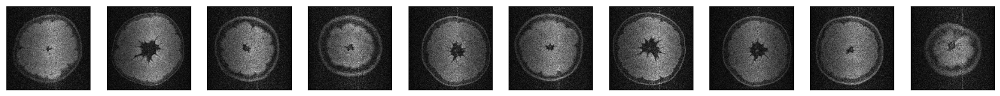

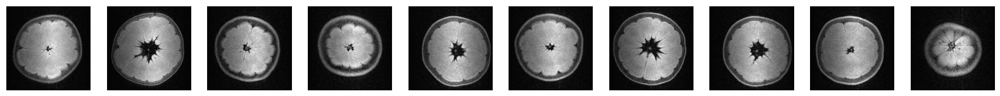

In [14]:
n = 10
plt.figure(figsize=(20, 10))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(x_train_noisy[i].reshape(x_train_noisy.shape[1], x_train_noisy.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

n = 10
plt.figure(figsize=(20, 10))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(x_train[i].reshape(x_train_noisy.shape[1], x_train_noisy.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

## Train

In [15]:
import importlib
import modelos_def
importlib.reload(modelos_def)

from modelos_def import skip_conection_pruebas

from modelos_def import dn_cnn

In [16]:
#10% from train Validation
x_train, x_val = train_test_split(x_train,
                                   test_size=0.1,
                                   random_state=SEED)

x_train_noisy, x_val_noisy = train_test_split(x_train_noisy,
                                   test_size=0.1,
                                   random_state=SEED)

print(x_train.shape)
print(x_val.shape)
print(x_train_noisy.shape)
print(x_val_noisy.shape)

(1930, 160, 160, 1)
(215, 160, 160, 1)
(1930, 160, 160, 1)
(215, 160, 160, 1)


In [17]:
input_img = tensorflow.keras.Input(shape=(x_train.shape[1], x_train.shape[1], 1))
print(input_img.shape)

decoded = dn_cnn(input_img)

autoencoder = tensorflow.keras.Model(input_img, decoded)

(None, 160, 160, 1)


In [18]:
#Para guardar las épocas al reentrenar
loss_list = []
val_loss_list = []
epoch_list = []

In [19]:
# Loss functtion
def ssim_loss(y_true, y_pred):
    return 1 - tensorflow.reduce_mean(tensorflow.image.ssim(y_true, y_pred, 1.0))

In [20]:
#autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
#autoencoder.compile(optimizer='adam', loss='mse')
optimizer=tensorflow.keras.optimizers.Adam(learning_rate=0.001)
autoencoder.compile(optimizer=optimizer, loss=ssim_loss)#, metrics=[ssim_loss, 'accuracy'])

In [21]:
autoencoder.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 160, 160, 64  640         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 160, 160, 64  0           ['conv2d[0][0]']                 
                                )                                                             

In [22]:
#Guardar cada 3 épocas los pesos
from tensorflow.keras.callbacks import ModelCheckpoint
checkpoint_callback = ModelCheckpoint(
    filepath='autoencoders_keras_physio_MRI_weights/save_weights_3_epocs/pesos_modelo_{epoch:08d}.h5',
    save_weights_only=True
)

In [23]:
#Time predict
start_time = datetime.now()

epocas = 30

batch_size = 5

autoencoder_train = autoencoder.fit(x_train_noisy, x_train,
                epochs= epocas,
                batch_size= batch_size,
                shuffle=True,
                validation_data=(x_val_noisy, x_val),
                callbacks=[checkpoint_callback])

#Time predict
print(" ")
print('Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))

Epoch 1/30
386/386 [==============================] - 126s 315ms/step - loss: 0.2236 - val_loss: 0.1611
Epoch 2/30
386/386 [==============================] - 128s 333ms/step - loss: 0.1536 - val_loss: 0.1478
Epoch 3/30
386/386 [==============================] - 132s 341ms/step - loss: 0.1363 - val_loss: 0.1380
Epoch 4/30
386/386 [==============================] - 132s 343ms/step - loss: 0.1367 - val_loss: 0.1379
Epoch 5/30
386/386 [==============================] - 132s 342ms/step - loss: 0.1302 - val_loss: 0.1312
Epoch 6/30
386/386 [==============================] - 132s 342ms/step - loss: 0.1281 - val_loss: 0.1272
Epoch 7/30
386/386 [==============================] - 132s 342ms/step - loss: 0.1260 - val_loss: 0.1287
Epoch 8/30
386/386 [==============================] - 132s 343ms/step - loss: 0.1224 - val_loss: 0.1227
Epoch 9/30
386/386 [==============================] - 132s 343ms/step - loss: 0.1210 - val_loss: 0.1221
Epoch 10/30
386/386 [==============================] - 132s 342m

In [24]:
loss = autoencoder_train.history['loss']
loss_list.extend(loss[:])
val_loss = autoencoder_train.history['val_loss']
val_loss_list.extend(val_loss[:])
epoch_list.append(epocas)
epochs = range(np.sum(epoch_list))

C:\Users\usuario\AppData\Local\Temp\ipykernel_18960\1594842982.py:3: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  plt.plot(epochs, loss_list, 'bo', color='#006699', label='Training loss')
C:\Users\usuario\AppData\Local\Temp\ipykernel_18960\1594842982.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss_list, 'b', color='#006699', label='Validation loss')


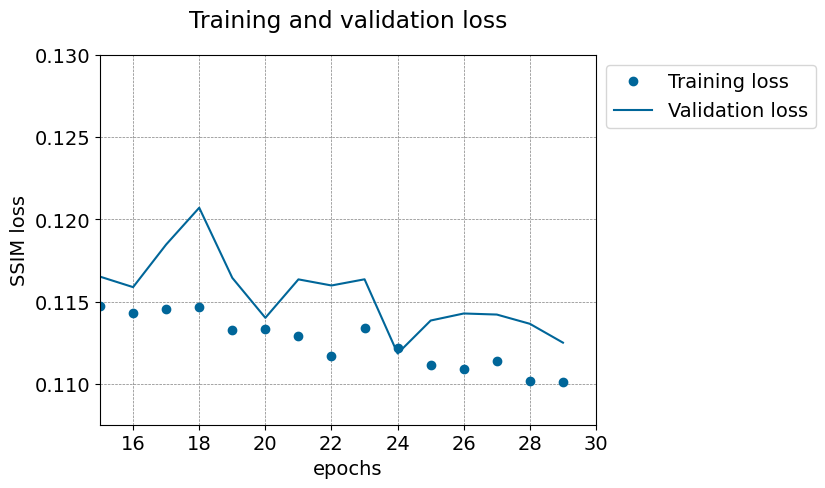

In [83]:
plt.figure()
plt.rcParams.update({'font.size': 14})
plt.plot(epochs, loss_list, 'bo', color='#006699', label='Training loss')
plt.plot(epochs, val_loss_list, 'b', color='#006699', label='Validation loss')
plt.xlabel('epochs')
plt.ylabel('SSIM loss')
plt.title('Training and validation loss', pad = 20)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
plt.gca().set_facecolor('white')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlim(15, 30)
plt.ylim(0.1075, 0.13)
plt.show()

In [26]:
print(optimizer)
print(batch_size)

print(loss_list)
print(val_loss_list)
print(epoch_list)

5
[0.22362278401851654, 0.1536068171262741, 0.13633708655834198, 0.13674308359622955, 0.130201518535614, 0.12813034653663635, 0.12601818144321442, 0.12238600850105286, 0.12098690122365952, 0.11881760507822037, 0.11728101968765259, 0.11739678680896759, 0.11756562441587448, 0.11680424958467484, 0.11554113030433655, 0.11473951488733292, 0.11430330574512482, 0.11455617100000381, 0.11463741958141327, 0.11329563707113266, 0.11331154406070709, 0.11291742324829102, 0.11166167259216309, 0.11341830343008041, 0.1121695414185524, 0.1111505851149559, 0.11090854555368423, 0.11135806888341904, 0.11016859114170074, 0.11008311808109283]
[0.16114754974842072, 0.147795170545578, 0.13796083629131317, 0.13791686296463013, 0.13123923540115356, 0.12716597318649292, 0.1287103146314621, 0.12272938340902328, 0.12208634614944458, 0.11645149439573288, 0.11987841129302979, 0.11761939525604248, 0.11723730713129044, 0.11554288864135742, 0.11518668383359909, 0.11651438474655151, 0.11587591469287872, 0.118470489978790

## Save

In [71]:
#path_load_save='autoencoders_keras_physio_MRI_weights/dae_skip_128_batch_norm_lr/pesos_modelo_00000060.h5'
path_load_save='autoencoders_keras_physio_MRI_weights/save_weights_3_epocs/pesos_modelo_00000030.h5'
#path_load_save='autoencoders_keras_physio_MRI_weights/dncnn_64_multiple_n/dncnn_multiple_n_mas_de_1_2_3.h5'

In [72]:
#Clear TF memory
tensorflow.keras.backend.clear_session() #to release all TF memory

In [73]:
autoencoder = tensorflow.keras.Model(input_img, decoded)

In [74]:
autoencoder.load_weights(path_load_save)

## Predict

In [219]:
n_scans=12

In [220]:
x_test = np.load('../save_images/no_augmentation/n_scans_' + str(n_scans) +'/bm4d_and_no_inhom/x_test.npy')
x_test_noisy = np.load('../save_images/no_augmentation/n_scans_' + str(n_scans) +'/bm4d_and_no_inhom/x_test_noisy.npy')

In [221]:
#PREDICCION BUENA
#Time predict
start_time = datetime.now() 
decoded_imgs = autoencoder.predict(x_test_noisy, batch_size=1)
#Time predict
print('Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))

Time elapsed (hh:mm:ss.ms) 0:00:01.373575


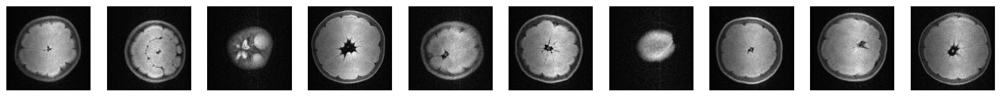

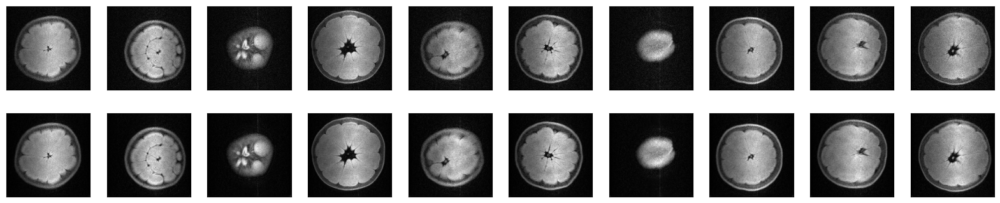

In [222]:
n = 10
plt.figure(figsize=(20, 4))
for i in range(1, n + 1):
    # Display original 
    ax = plt.subplot(2, n, i + n)
    plt.imshow(x_test[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

n = 10
plt.figure(figsize=(20, 4))
for i in range(1, n + 1):
    # Display original noise
    ax = plt.subplot(2, n, i)
    plt.imshow(x_test_noisy[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # Display reconstruction
    ax = plt.subplot(2, n, i + n)
    plt.imshow(decoded_imgs[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

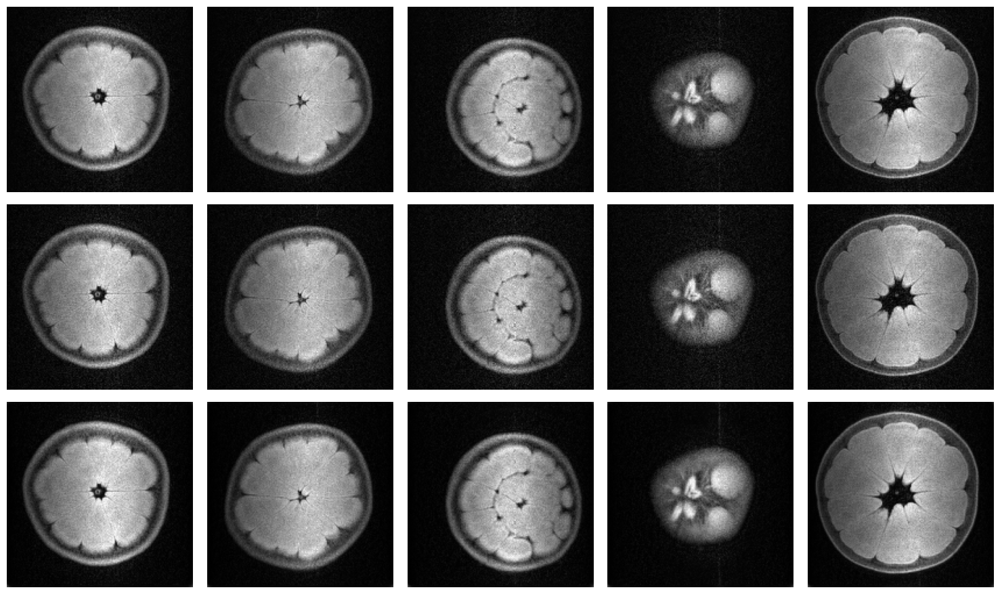

In [223]:
utils.show_image(x_test, x_test_noisy, decoded_imgs)

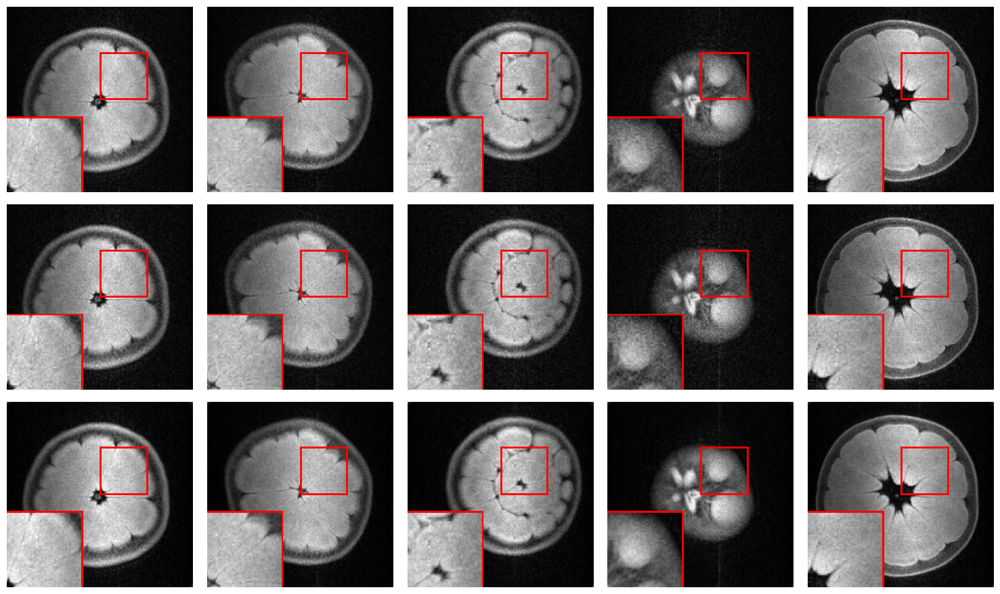

In [224]:
utils.show_windows_image(x_test, x_test_noisy, decoded_imgs)

## Métricas

In [225]:
#PSNR
from skimage.metrics import peak_signal_noise_ratio as psnr
psnr_general=0
psnr_noise_hist=[]
for i in list(range(x_test.shape[0])):
    psnr_noise = psnr(x_test[i,:,:,0], decoded_imgs[i,:,:,0])
    psnr_noise_hist.append(psnr_noise)
    psnr_general=psnr_general+psnr_noise

mean_psnr = psnr_general/x_test.shape[0]

#std PSNR
sum_std = []
for i in list(range(x_test.shape[0])):
    psnr_noise = psnr(x_test[i,:,:,0], decoded_imgs[i,:,:,0])
    psnr_noise_mean = (psnr_noise - mean_psnr)**2
    sum_std.append(psnr_noise_mean)

psnr_std = (np.sum(psnr_noise_mean)/x_test.shape[0])**0.5
print('PSNR: '+ str(mean_psnr) + " +- " + str(psnr_std))


#SSIM
from skimage.metrics import structural_similarity as ssim
ssim_general=0
ssim_noise_hist=[]

#Compute the mean structural similarity index between two images.
for i in list(range(x_test.shape[0])):
    ssim_noise = ssim(x_test[i,:,:,0], decoded_imgs[i,:,:,0],
                  data_range=decoded_imgs[i,:,:,0].max() - decoded_imgs[i,:,:,0].min())
    ssim_noise_hist.append(ssim_noise)
    ssim_general=ssim_general+ssim_noise
    
mean_ssim = ssim_general/x_test.shape[0]

#std SSIM
sum_std = []
for i in list(range(x_test.shape[0])):
    ssim_noise = ssim(x_test[i,:,:,0], decoded_imgs[i,:,:,0],
                  data_range=decoded_imgs[i,:,:,0].max() - decoded_imgs[i,:,:,0].min())
    ssim_noise_mean = (ssim_noise - mean_ssim)**2
    sum_std.append(ssim_noise_mean)
    
ssim_std = (np.sum(ssim_noise_mean)/x_test.shape[0])**0.5
print("SSIM: "+ str(mean_ssim) + " +- " + str(ssim_std))

PSNR: 37.19597848740838 +- 0.07011600002019118
SSIM: 0.919422906523015 +- 0.001032700283093435


C:\Users\usuario\AppData\Local\Temp\ipykernel_18960\2183798020.py:6: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noise = psnr(x_test[i,:,:,0], decoded_imgs[i,:,:,0])
C:\Users\usuario\AppData\Local\Temp\ipykernel_18960\2183798020.py:15: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noise = psnr(x_test[i,:,:,0], decoded_imgs[i,:,:,0])


In [226]:
x_test.shape

(36, 160, 160, 1)

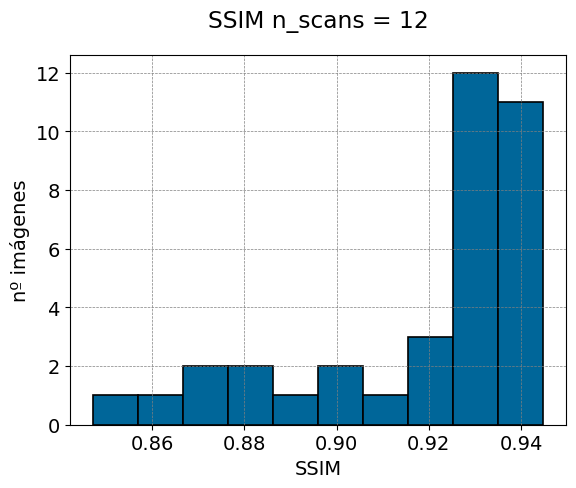

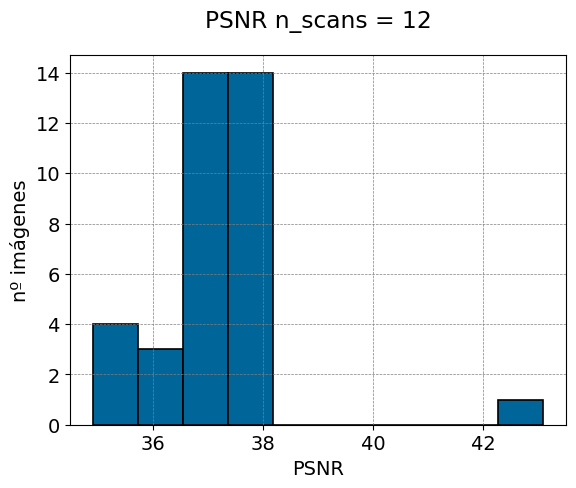

In [227]:
plt.rcParams.update({'font.size': 14})
plt.hist(ssim_noise_hist, color='#006699', edgecolor='black', linewidth=1.2)
plt.xlabel('SSIM')
plt.ylabel('nº imágenes')
plt.title('SSIM n_scans = ' +  str(n_scans), pad = 20)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
plt.gca().set_facecolor('white')
plt.show()

plt.rcParams.update({'font.size': 14})
plt.hist(psnr_noise_hist, color='#006699', edgecolor='black', linewidth=1.2)
plt.xlabel('PSNR')
plt.ylabel('nº imágenes')
plt.title('PSNR n_scans = ' +  str(n_scans), pad = 20)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
plt.gca().set_facecolor('white')
plt.show()

In [228]:
hist_sort_values=np.sort(ssim_noise_hist)
hist_sort_index=np.argsort(ssim_noise_hist)

hist_sort_values_psnr=np.sort(psnr_noise_hist)
hist_sort_index_psnr=np.argsort(psnr_noise_hist)

**worst ssim and psnr**

In [229]:
worst_ssim=hist_sort_index[:5]
worst_psnr=hist_sort_index_psnr[:5]

In [230]:
worst_ssim

array([ 7, 27, 19, 21, 23], dtype=int64)

In [231]:
print(hist_sort_values[:5])
print(hist_sort_values_psnr[:5])

[0.84712878 0.86279486 0.870342   0.87534507 0.88320727]
[34.90792749 34.93653078 35.08305694 35.44858631 35.77745008]


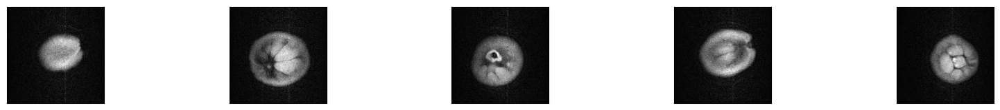

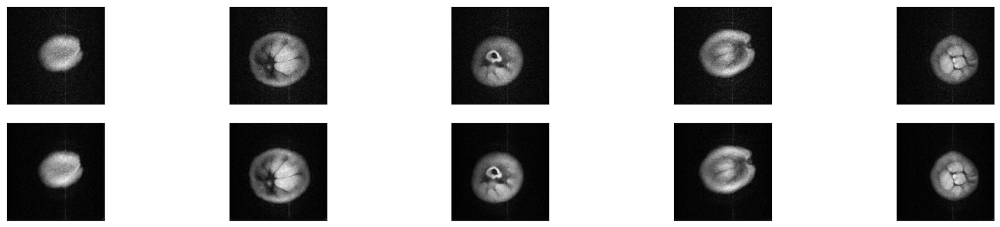

In [232]:
n = 5
plt.figure(figsize=(20, 4))

j=0
for i,j in zip(worst_ssim, range(1, n + 1)):
    # Display original 
    ax = plt.subplot(2, n, j + n)
    plt.imshow(x_test[i].reshape(x_test.shape[1], x_test.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

n = 5
plt.figure(figsize=(20, 4))
for i,j in zip(worst_ssim, range(1, n + 1)):
    # Display original noise
    ax = plt.subplot(2, n, j)
    plt.imshow(x_test_noisy[i].reshape(x_test.shape[1], x_test.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # Display reconstruction
    ax = plt.subplot(2, n, j + n)
    plt.imshow(decoded_imgs[i].reshape(x_test.shape[1], x_test.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

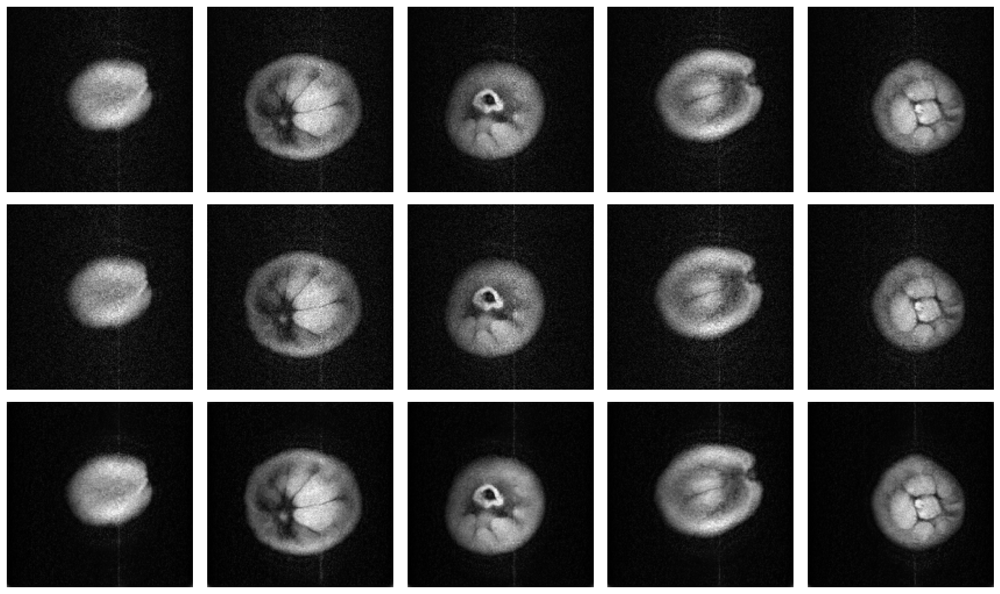

In [233]:
utils.show_image_worstbest(x_test, x_test_noisy, decoded_imgs, worst_ssim)

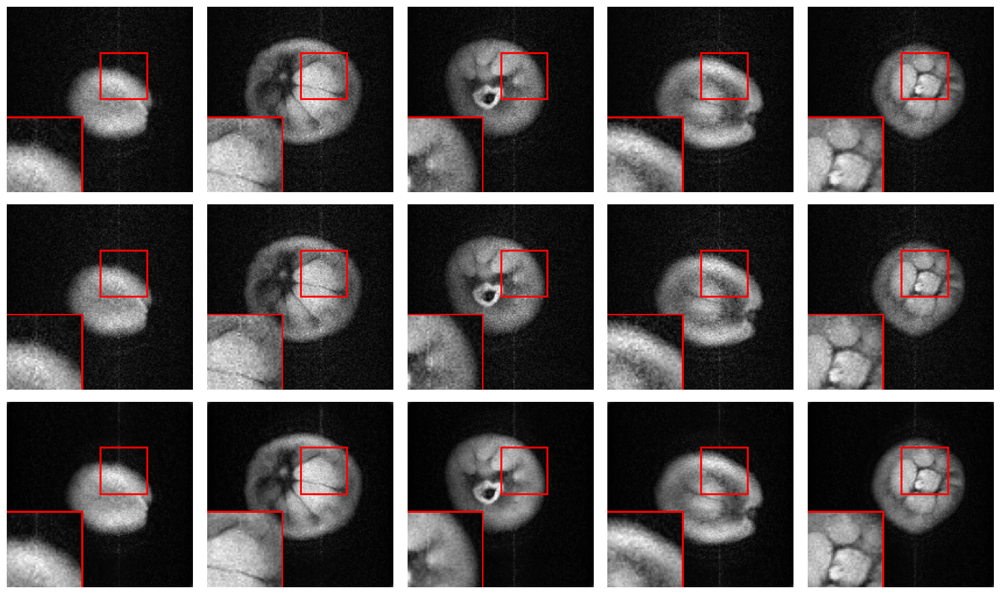

In [234]:
utils.show_windows_image_worstbest(x_test, x_test_noisy, decoded_imgs, worst_ssim)

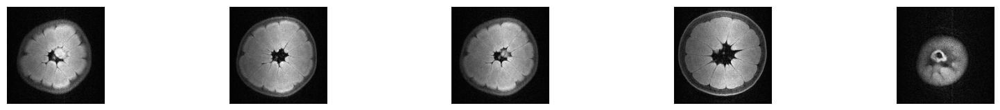

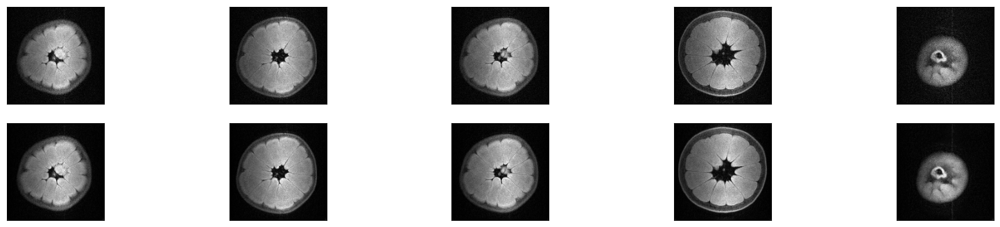

In [235]:
n = 5
plt.figure(figsize=(20, 4))

j=0
for i,j in zip(worst_psnr, range(1, n + 1)):
    # Display original 
    ax = plt.subplot(2, n, j + n)
    plt.imshow(x_test[i].reshape(x_test.shape[1], x_test.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

n = 5
plt.figure(figsize=(20, 4))
for i,j in zip(worst_psnr, range(1, n + 1)):
    # Display original noise
    ax = plt.subplot(2, n, j)
    plt.imshow(x_test_noisy[i].reshape(x_test.shape[1], x_test.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # Display reconstruction
    ax = plt.subplot(2, n, j + n)
    plt.imshow(decoded_imgs[i].reshape(x_test.shape[1], x_test.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

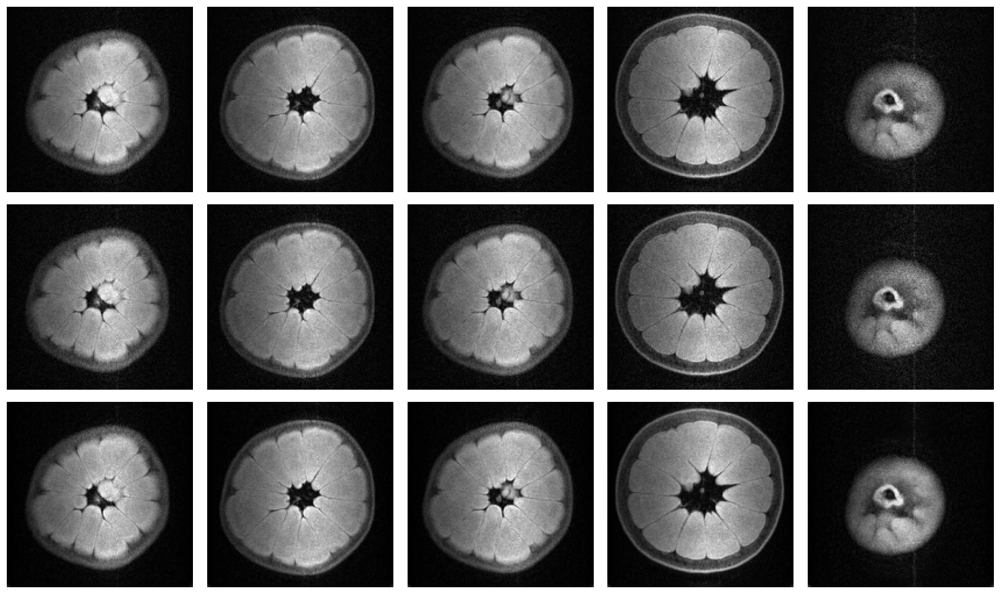

In [236]:
utils.show_image_worstbest(x_test, x_test_noisy, decoded_imgs, worst_psnr)

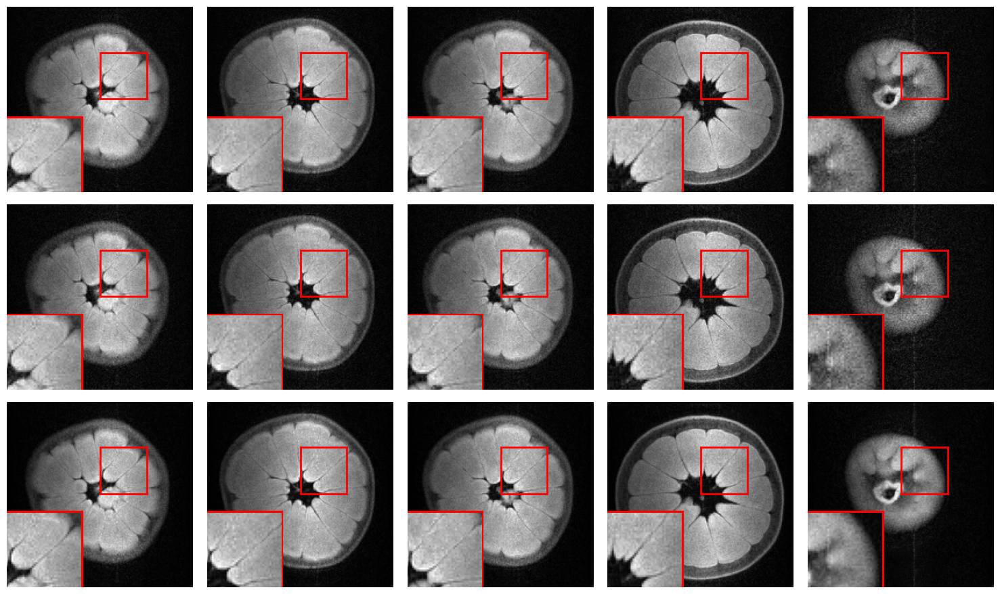

In [237]:
utils.show_windows_image_worstbest(x_test, x_test_noisy, decoded_imgs, worst_psnr)

**best SSIM**

In [238]:
best_ssim=hist_sort_index[len(hist_sort_index)-5:len(hist_sort_index)]
best_psnr=hist_sort_index_psnr[len(hist_sort_index_psnr)-5:len(hist_sort_index_psnr)]

In [239]:
print(hist_sort_values[len(hist_sort_values)-5:len(hist_sort_values)])
print(hist_sort_values_psnr[len(hist_sort_values_psnr)-5:len(hist_sort_values_psnr)])

[0.94035011 0.94075298 0.94188936 0.94379407 0.94482274]
[37.82491699 37.86113856 37.97350913 38.03465437 43.09468148]


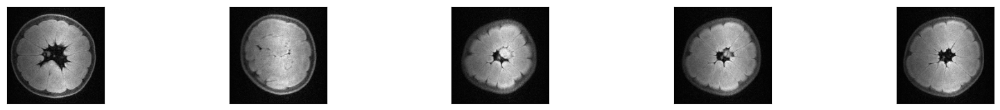

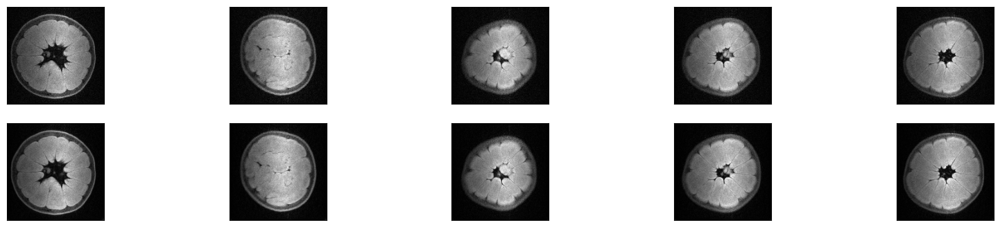

In [240]:
n = 5
plt.figure(figsize=(20, 4))

j=0
for i,j in zip(best_ssim, range(1, n + 1)):
    # Display original 
    ax = plt.subplot(2, n, j + n)
    plt.imshow(x_test[i].reshape(x_test.shape[1], x_test.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

n = 5
plt.figure(figsize=(20, 4))
for i,j in zip(best_ssim, range(1, n + 1)):
    # Display original noise
    ax = plt.subplot(2, n, j)
    plt.imshow(x_test_noisy[i].reshape(x_test.shape[1], x_test.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    
    
    # Display reconstruction
    ax = plt.subplot(2, n, j + n)
    plt.imshow(decoded_imgs[i].reshape(x_test.shape[1], x_test.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

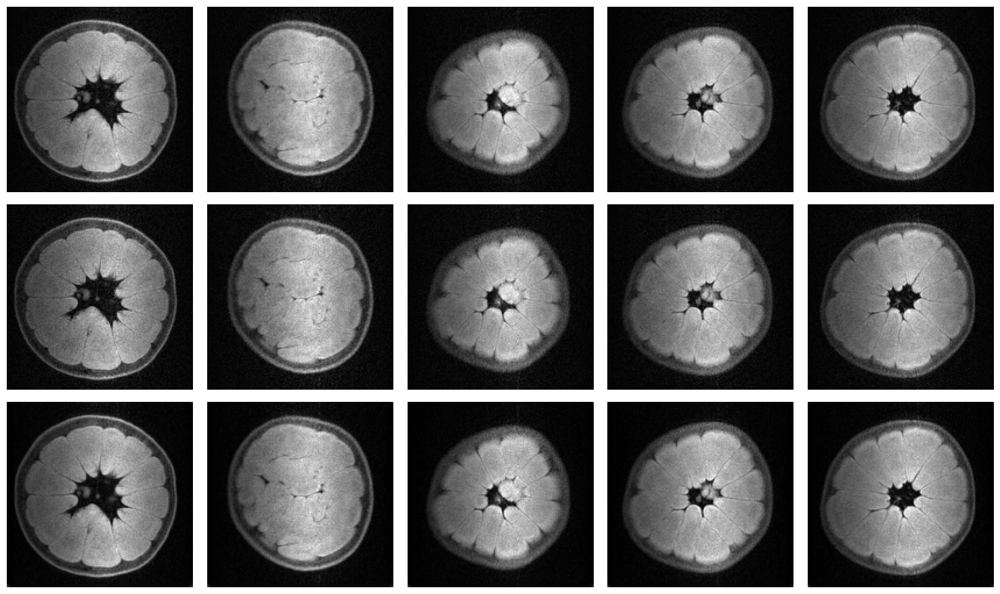

In [241]:
utils.show_image_worstbest(x_test, x_test_noisy, decoded_imgs, best_ssim)

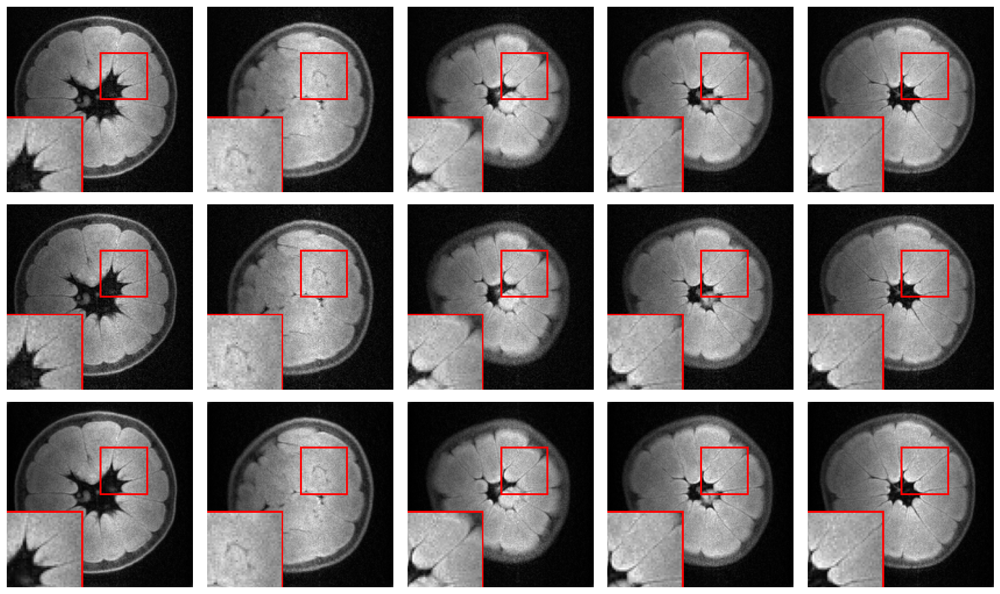

In [242]:
utils.show_windows_image_worstbest(x_test, x_test_noisy, decoded_imgs, best_ssim)

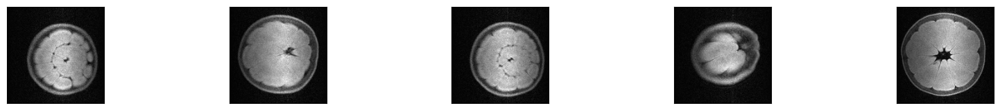

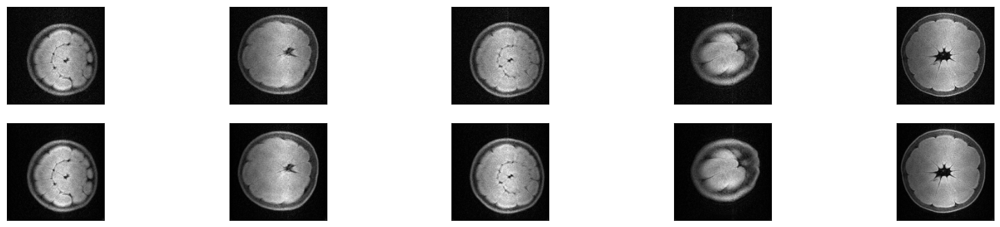

In [243]:
    n = 5
    plt.figure(figsize=(20, 4))

    j=0
    for i,j in zip(best_psnr, range(1, n + 1)):
        # Display original 
        ax = plt.subplot(2, n, j + n)
        plt.imshow(x_test[i].reshape(x_test.shape[1], x_test.shape[1]))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

    n = 5
    plt.figure(figsize=(20, 4))
    for i,j in zip(best_psnr, range(1, n + 1)):
        # Display original noise
        ax = plt.subplot(2, n, j)
        plt.imshow(x_test_noisy[i].reshape(x_test.shape[1], x_test.shape[1]))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)



        # Display reconstruction
        ax = plt.subplot(2, n, j + n)
        plt.imshow(decoded_imgs[i].reshape(x_test.shape[1], x_test.shape[1]))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

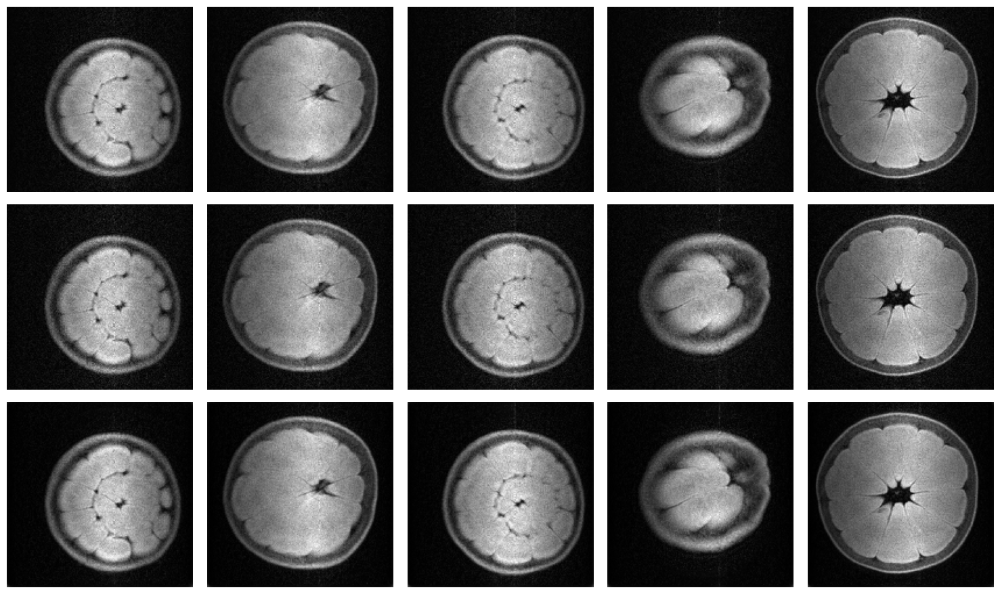

In [244]:
utils.show_image_worstbest(x_test, x_test_noisy, decoded_imgs, best_psnr)

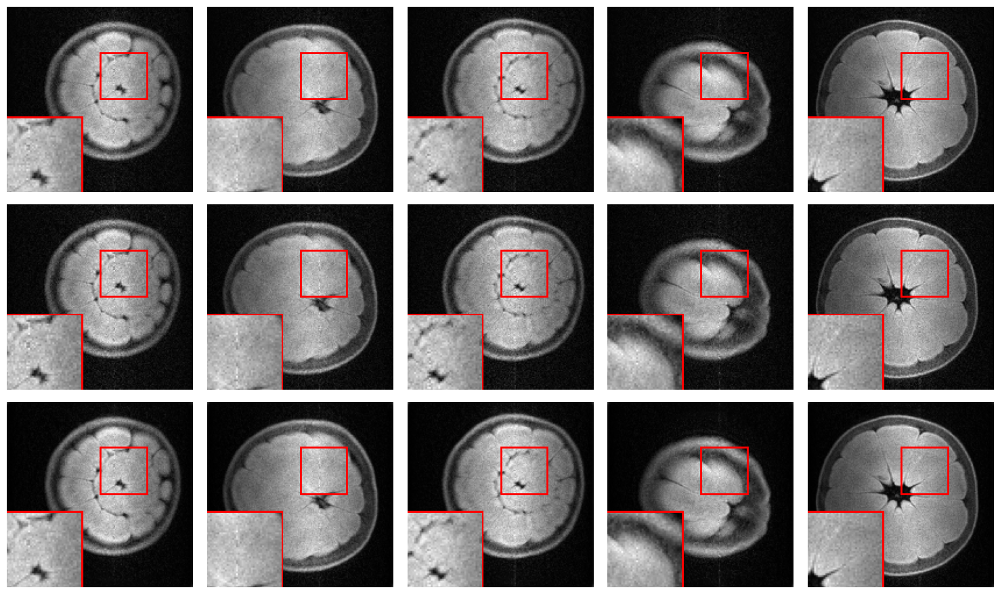

In [245]:
utils.show_windows_image_worstbest(x_test, x_test_noisy, decoded_imgs, best_psnr)